In [1]:
import cv2
import numpy as np
from math import *
from skimage import io
from matplotlib import pyplot as plt

In [2]:
base_data_folder = 'data/'

In [3]:
def show_image(img, title=""):
    plt.figure(figsize=(20,20))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    if title:
        plt.title(title)
    
def read_img(filename):
    return cv2.imread(base_data_folder + filename)

def add_points(img, points, colors):
    img_c = img.copy()
    for point, color in zip(points, colors):
        img_c = cv2.circle(img_c, (point[0], point[1]), 15, color, 5)
    return img_c

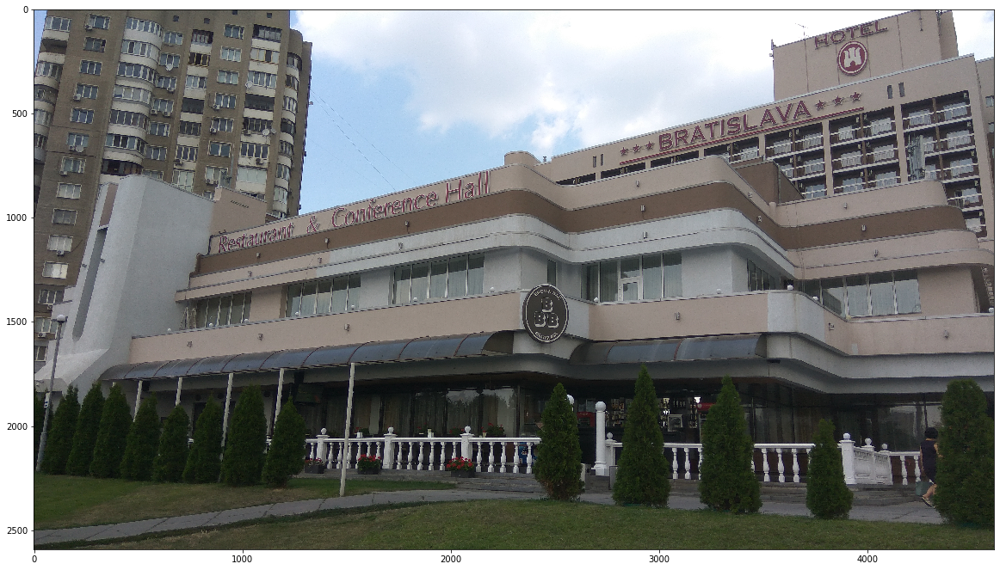

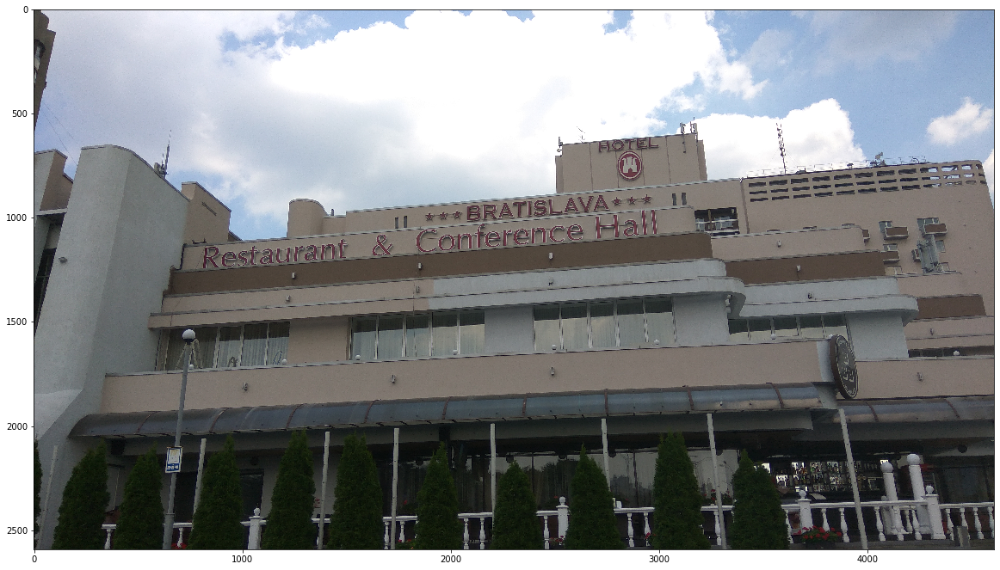

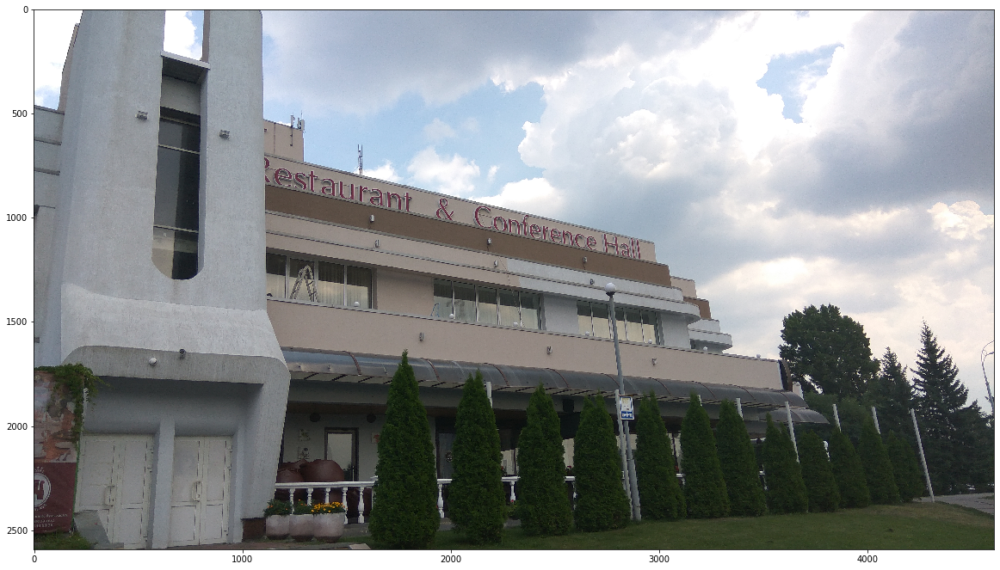

In [4]:
img1 = read_img("img01.jpg")
img2 = read_img("img02.jpg")
img3 = read_img("img03.jpg")
show_image(img1)
show_image(img2)
show_image(img3)

In [5]:
colors = [
    (255, 0, 0),
    (0, 255, 0),
    (0, 0, 255),
    (255, 255, 0),
    (0, 255, 255),
    (255, 0, 255),
    (255, 140, 0),
    (255, 0, 140)
]

points1 = np.array(
    [
        [355,1045], 
        [335,1210],
        [1080,1185],
        [1040,1270],
        [750,1600],
        [2175,780],
        [2200,1345],
        [2150,1650],
    ]
)

points2 = np.array(
    [
        [150,962], 
        [145,1205],
        [1250,1280],
        [1220,1380],
        [1020,1810],
        [2970,965],
        [3550,1565],
        [3775,1900],
    ]
)

points3 = np.array(
    [
        [845,275], 
        [920,590],
        [1630,1000],
        [1650,1115],
        [1860,1565],
        [2900,1110],
        [3480,1670],
        [3715,1910],
    ]
)

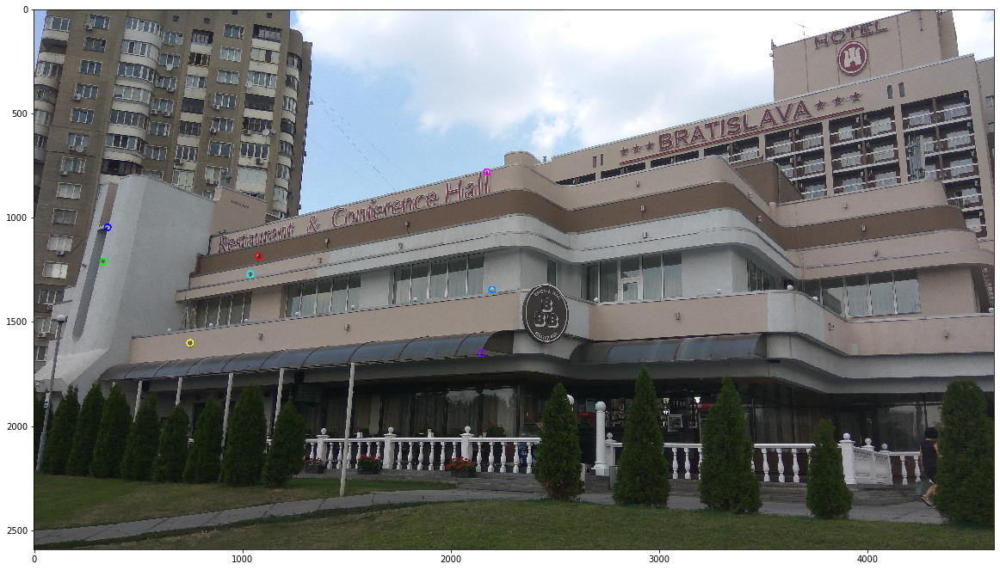

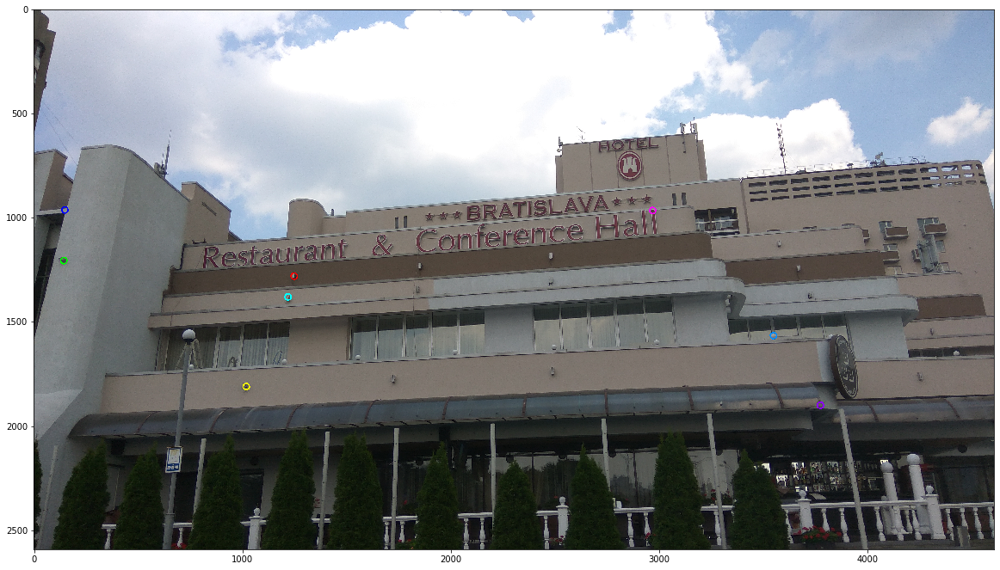

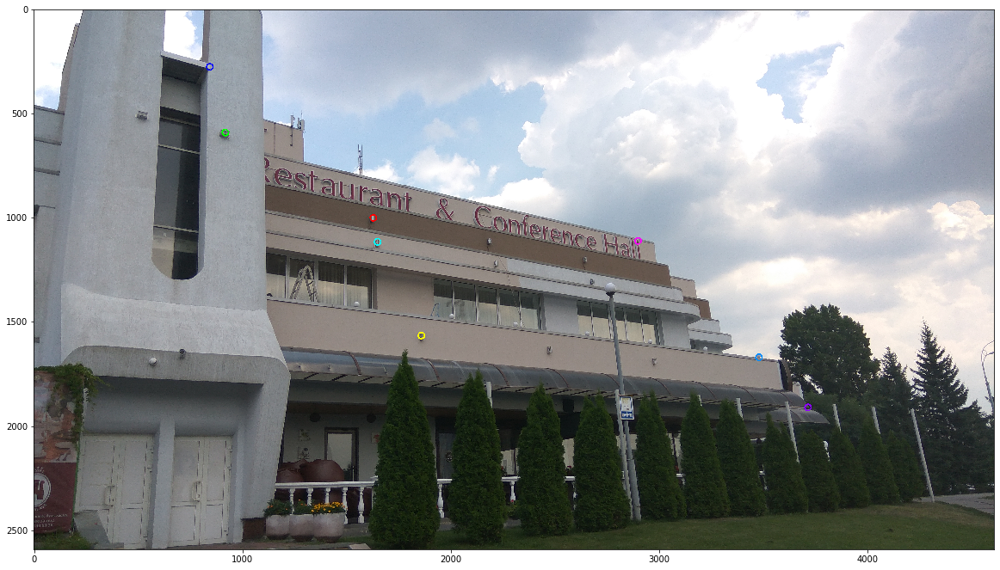

In [6]:
img1_c = add_points(img1, points1, colors)
show_image(img1_c)
img2_c = add_points(img2, points2, colors)
show_image(img2_c)
img3_c = add_points(img3, points3, colors)
show_image(img3_c)

In [7]:
def to_hom(pts):
    return np.transpose(np.append(np.transpose(pts), [np.ones(len(pts))], axis=0))

def normalise2dpts(points):
    points_hom = np.transpose(np.append(np.transpose(points), [np.ones(len(points))], axis=0))
    
    # Centroids
    centroid_x, centroid_y, _ = np.mean(points_hom, axis=0)
    
    # Shift origin to centroid
    new_points_x = points_hom[:,0] - centroid_x 
    new_points_y = points_hom[:,1] - centroid_y

    mean_dist = np.mean(np.sqrt(new_points_x**2 + new_points_y**2))
    
    scale = np.sqrt(2) / mean_dist
    
    T = [
        [scale, 0, -scale*centroid_x],
        [0, scale, -scale*centroid_y],
        [0, 0, 1],
    ]
    new_points = np.dot(T, np.transpose(points_hom))    
    return new_points, T

def get_fundamental_matrix(points1, points2):
    norm_points_1, T_1 = normalise2dpts(points1)
    norm_points_2, T_2 = normalise2dpts(points2)
    
    A = np.transpose([
        norm_points_2[0] * norm_points_1[0], 
        norm_points_2[0] * norm_points_1[1],
        norm_points_2[0],
        norm_points_2[1] * norm_points_1[0],
        norm_points_2[1] * norm_points_1[1],
        norm_points_2[1],
        norm_points_1[0],
        norm_points_1[1],
        np.ones(len(points1))
    ])
    
    U, D, V = np.linalg.svd(A)
    
    F = V[-1].reshape(3,3)
    
    U, D, V = np.linalg.svd(F)
    F = np.dot(np.dot(U, np.diag([D[0], D[1], 0])), V)
    
    F = np.dot(np.dot(np.transpose(T_2), F), T_1)
    return F

In [8]:
def find_epilines(points, F, second=False):
    lines = []
    for point in points:
        point = np.array([point[0], point[1], 1])
        if second:
            line = np.dot(np.transpose(F), point)
        else:
            line = np.dot(F, point)
        lines.append(line)
    return np.array(lines)

def drawlines(img, lines, colors):
    result = img.copy()
    _, width, _ = result.shape
    
    for line, color in zip(lines, colors):
        a, b, c = line
        point1 = (0, int(-c / b))
        point2 = (width, int(-(a * width + c)/ b ))
        result = cv2.line(result, point1, point2, color, 5)
    show_image(result)

# Img1 and Img2

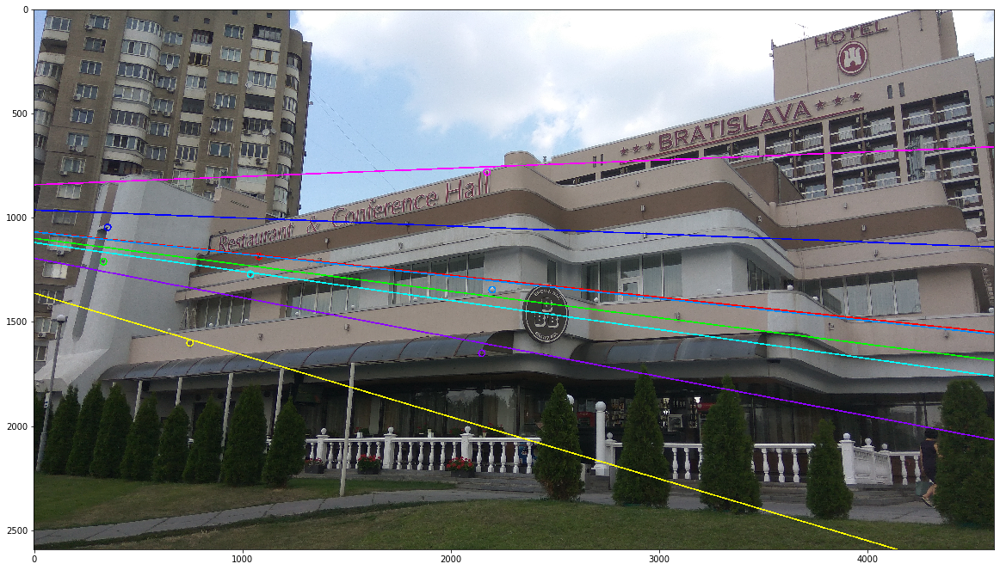

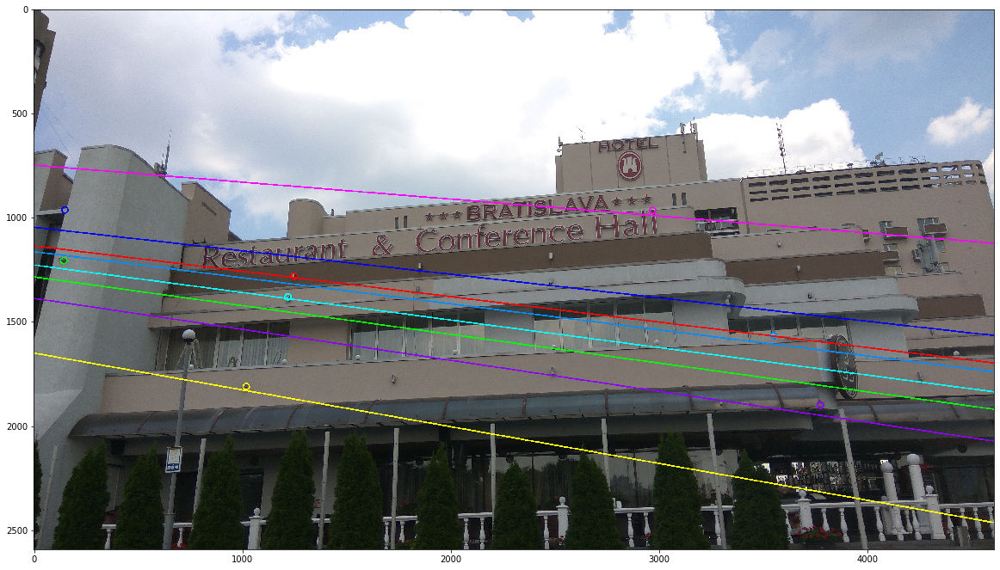

In [9]:
F = get_fundamental_matrix(points1, points2)
lines = find_epilines(points2, F, True)
drawlines(img1_c, lines, colors)
lines = find_epilines(points1, F)
drawlines(img2_c, lines, colors)

# Img2 and Img3

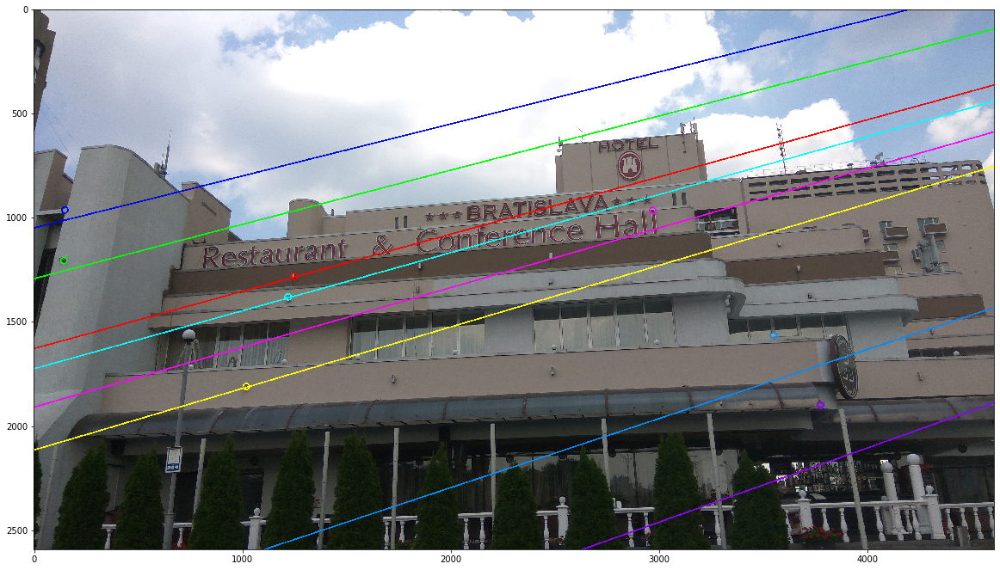

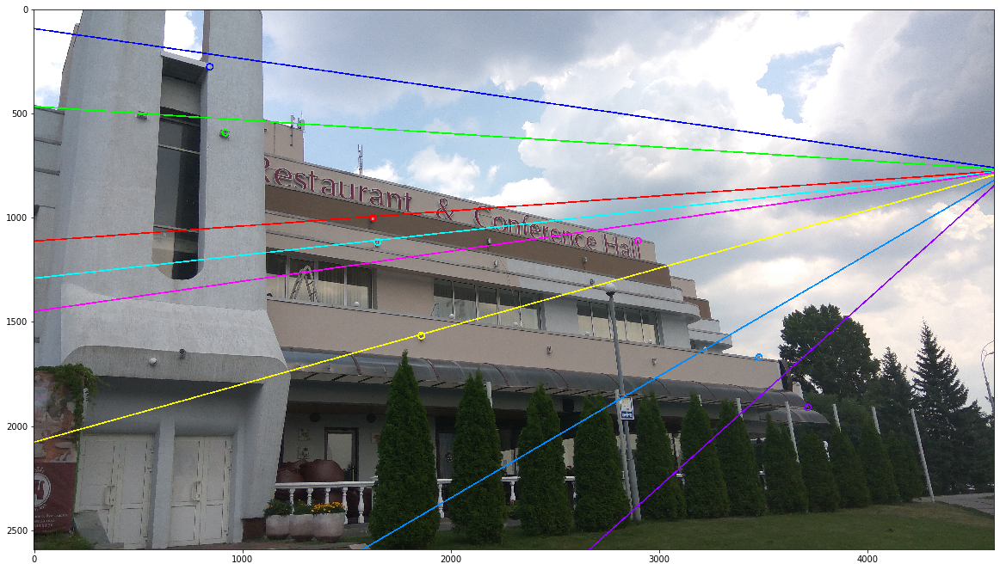

In [10]:
F = get_fundamental_matrix(points2, points3)
lines = find_epilines(points3, F, True)
drawlines(img2_c, lines, colors)
lines = find_epilines(points2, F)
drawlines(img3_c, lines, colors)

# Img1 and Img3

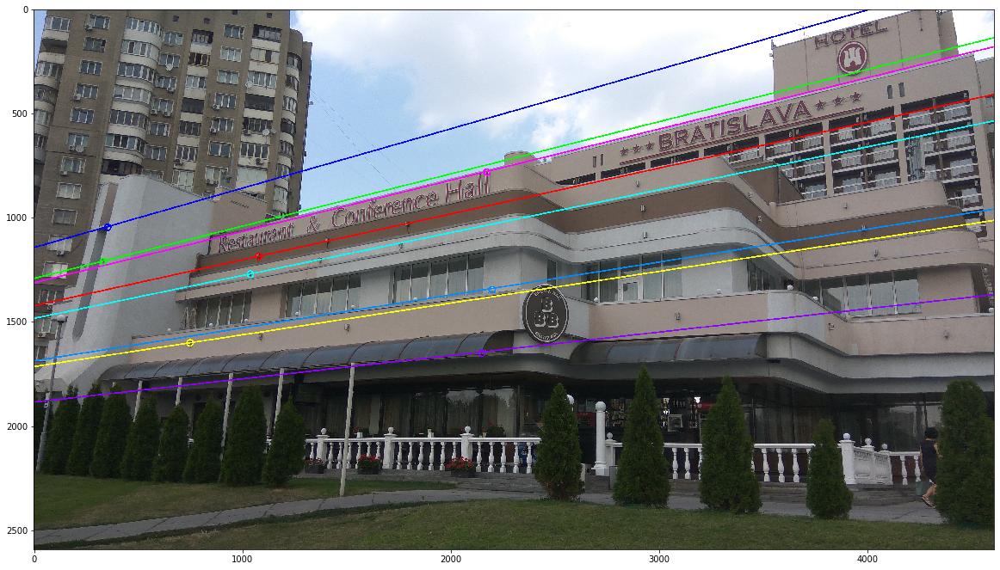

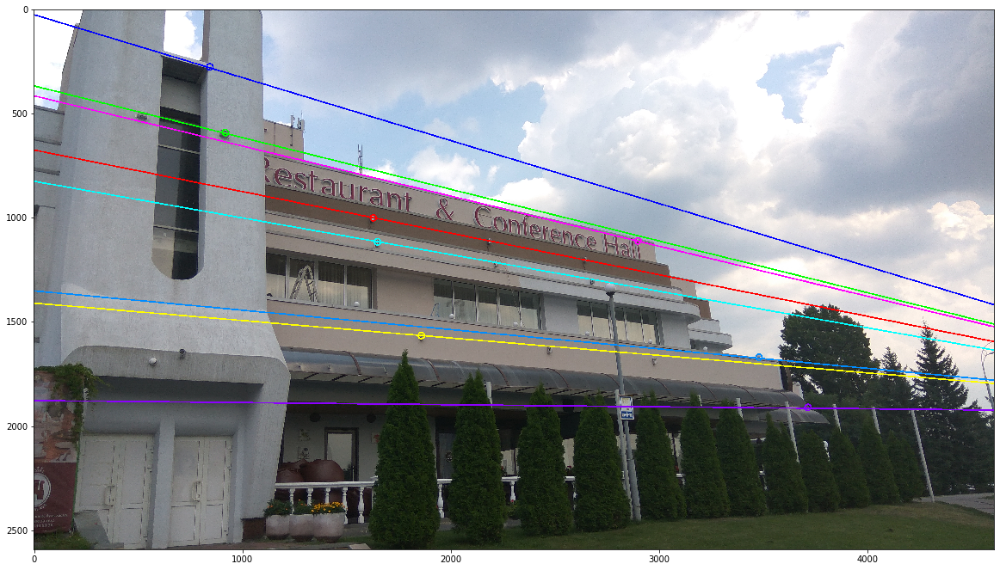

In [11]:
F = get_fundamental_matrix(points1, points3)
lines = find_epilines(points3, F, True)
drawlines(img1_c, lines, colors)
lines = find_epilines(points1, F)
drawlines(img3_c, lines, colors)